In [2]:
import pandas as pd
import numpy as np

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

In [53]:
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

## Data Description

Images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. A total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains<br>

Link: https://archive.ics.uci.edu/dataset/602/dry+bean+dataset <br>

1.) Area (A): The area of a bean zone and the number of pixels within its boundaries.
<br>
2.) Perimeter (P): Bean circumference is defined as the length of its border.
<br>
3.) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.<br>
4.) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.<br>
5.) Aspect ratio (K): Defines the relationship between L and l.<br>
6.) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.<br>
7.) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.<br>
8.) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.<br>
9.) Extent (Ex): The ratio of the pixels in the bounding box to the bean area.<br>
10.)Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.<br>
11.)Roundness (R): Calculated with the following formula: (4piA)/(P^2)<br>
12.)Compactness (CO): Measures the roundness of an object: Ed/L<br>
13.)ShapeFactor1 (SF1)<br>
14.)ShapeFactor2 (SF2)<br>
15.)ShapeFactor3 (SF3)<br>
16.)ShapeFactor4 (SF4)<br>


17.)Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

Data source: <br>

Murat KOKLU
Faculty of Technology,
Selcuk University,
TURKEY.
ORCID : 0000-0002-2737-2360
mkoklu@selcuk.edu.tr

Ilker Ali OZKAN
Faculty of Technology,
Selcuk University,
TURKEY.
ORCID : 0000-0002-5715-1040
ilkerozkan@selcuk.edu.tr


In [4]:
# Read dry bean data
data = pd.read_excel("DryBeanDataset/Dry_Bean_Dataset.xlsx")

In [5]:
data

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


## Exploratory Data analysis

In [6]:
# Check the first few rows
print(data.head())

    Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  28395    610.291       208.178117       173.888747      1.197191   
1  28734    638.018       200.524796       182.734419      1.097356   
2  29380    624.110       212.826130       175.931143      1.209713   
3  30008    645.884       210.557999       182.516516      1.153638   
4  30140    620.134       201.847882       190.279279      1.060798   

   Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0      0.549812       28715     190.141097  0.763923  0.988856   0.958027   
1      0.411785       29172     191.272750  0.783968  0.984986   0.887034   
2      0.562727       29690     193.410904  0.778113  0.989559   0.947849   
3      0.498616       30724     195.467062  0.782681  0.976696   0.903936   
4      0.333680       30417     195.896503  0.773098  0.990893   0.984877   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  Class  
0     0.913358      0.007332  

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [26]:
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


C:\Users\emax4\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


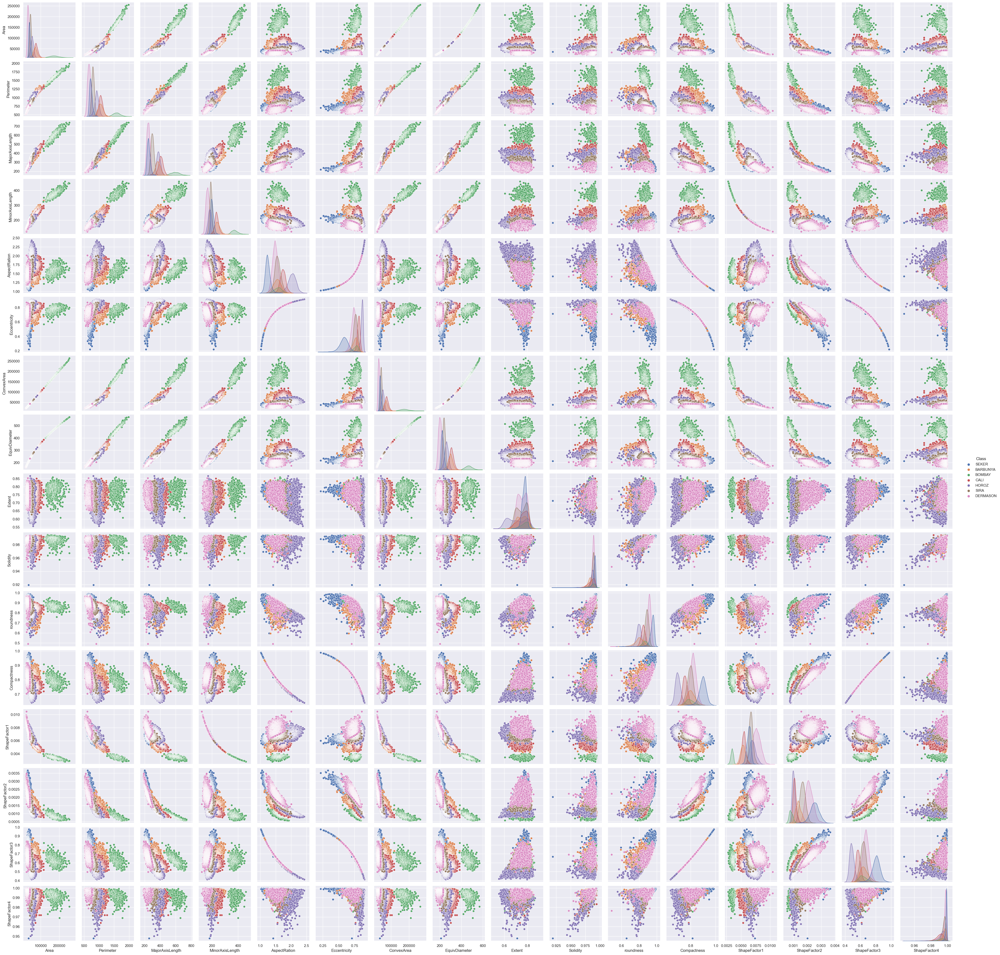

In [27]:
sns.pairplot(data, hue='Class')
plt.show()

In [7]:
# Separate features and target
X = data.drop(columns=['Class'])
y = data['Class']

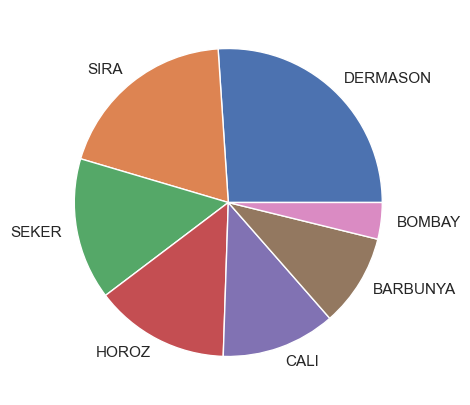

In [29]:
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [8]:
# Encode the target variable (e.g., 'SEKER' -> 0, etc.)
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
print(f"Classes: {label_encoder.classes_}")

Classes: ['BARBUNYA' 'BOMBAY' 'CALI' 'DERMASON' 'HOROZ' 'SEKER' 'SIRA']


In [34]:
# Map classes to its number represntation
label_name_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

In [35]:
label_name_mapping

{'BARBUNYA': 0,
 'BOMBAY': 1,
 'CALI': 2,
 'DERMASON': 3,
 'HOROZ': 4,
 'SEKER': 5,
 'SIRA': 6}

In [9]:
y_encoded

array([5, 5, 5, ..., 3, 3, 3])

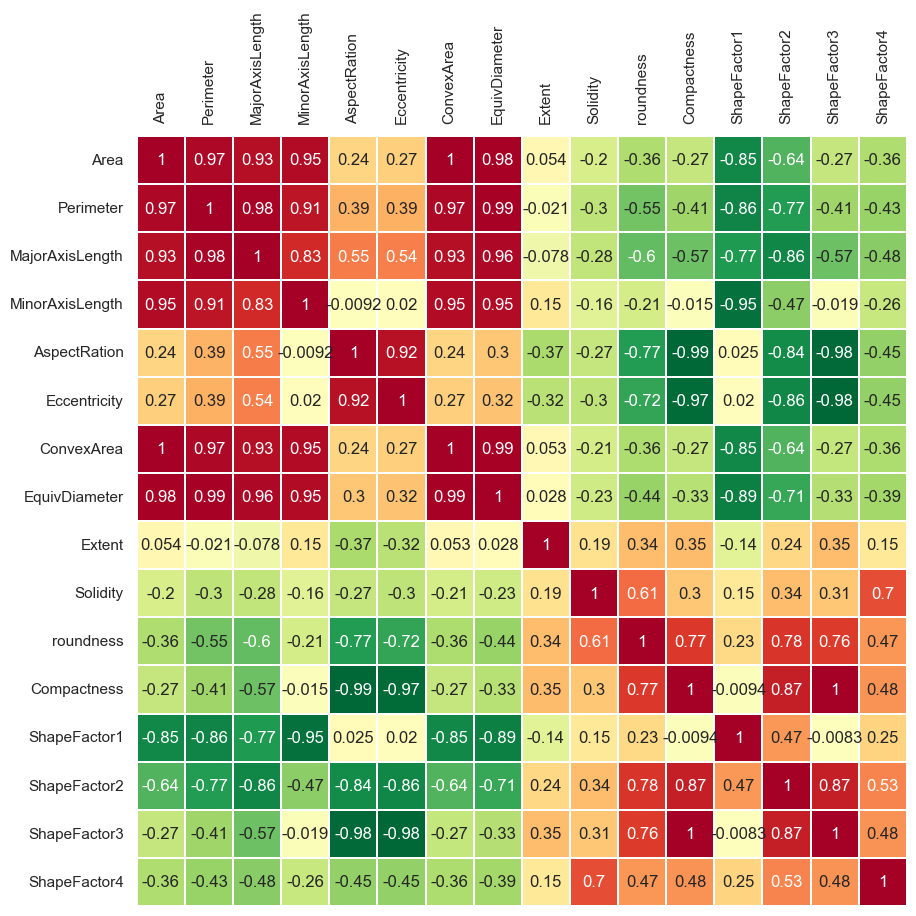

In [23]:
# Correlation matrix
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [31]:
X.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,1.000000,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721
Perimeter,0.966722,1.000000,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310
MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527
MinorAxisLength,0.951602,0.913179,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749
AspectRation,0.241735,0.385276,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264
Eccentricity,0.267481,0.391066,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354
ConvexArea,0.999939,0.967689,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049
EquivDiameter,0.984968,0.991380,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512
Extent,0.054345,-0.021160,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502
Solidity,-0.196585,-0.303970,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163


In [10]:
# Standardize the numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [11]:
# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)


## Principal Component Analysis (PCA)

In [39]:
# Apply PCA
pca = PCA()
Z = pca.fit_transform(X)

In [45]:
Z

array([[-3.51499237e+04, -2.20868414e+01,  8.32067957e+01, ...,
        -7.63924020e-05, -1.04915113e-04,  6.31732530e-05],
       [-3.45863219e+04,  5.85865649e+01,  7.31450790e+01, ...,
         3.11528200e-04, -1.28680595e-04,  9.12187534e-05],
       [-3.37640263e+04, -3.89953729e+01,  7.45121433e+01, ...,
        -1.10854110e-04, -9.36983446e-05,  5.30026592e-05],
       ...,
       [-1.56345152e+04, -8.72390530e+01,  1.24999846e+01, ...,
         6.36243776e-05,  8.18481963e-05, -3.26480270e-06],
       [-1.55590550e+04, -2.40310051e+01,  1.37846596e+01, ...,
         8.94522316e-05,  8.90113562e-05, -4.00307086e-06],
       [-1.55983141e+04, -7.82400447e+01, -4.58653076e+00, ...,
        -3.91791743e-05,  7.87080981e-05,  5.40675814e-06]])

In [57]:
class_labels = y.unique()
class_colors = {label: idx for idx, label in enumerate(class_labels)}
y_encoded = y.map(class_colors)

In [58]:
# Determine the optimal number of components
n_components_95 = np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1
print(f"Number of PCs for 95% variance: {n_components_95}")

# Refit PCA with the optimal number of components for visualization (2 components)
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

Number of PCs for 95% variance: 4


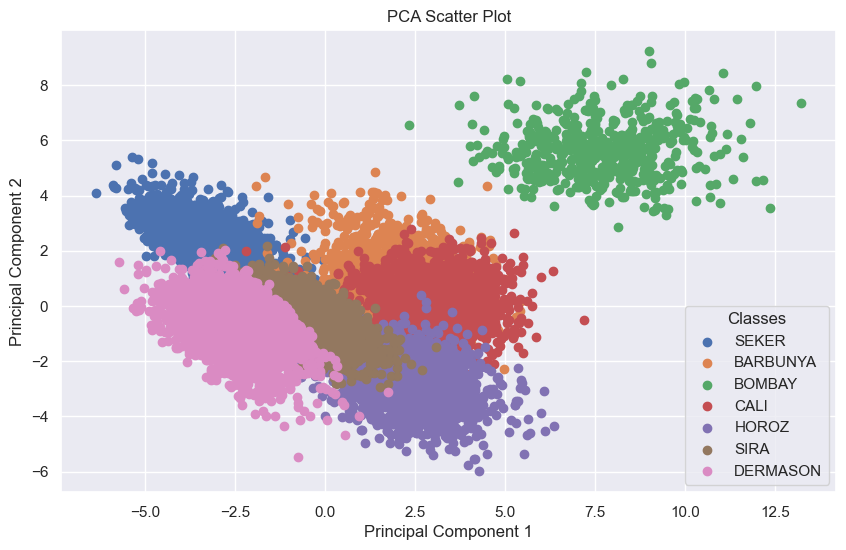

In [59]:
# Scatter plot of first two PCs
plt.figure(figsize=(10, 6))
for label, color_idx in class_colors.items():
    plt.scatter(
        X_pca_2d[y_encoded == color_idx, 0],
        X_pca_2d[y_encoded == color_idx, 1],
        label=label
    )
plt.title('PCA Scatter Plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.legend(title="Classes")
plt.show()

In [13]:
# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

### Scree plot


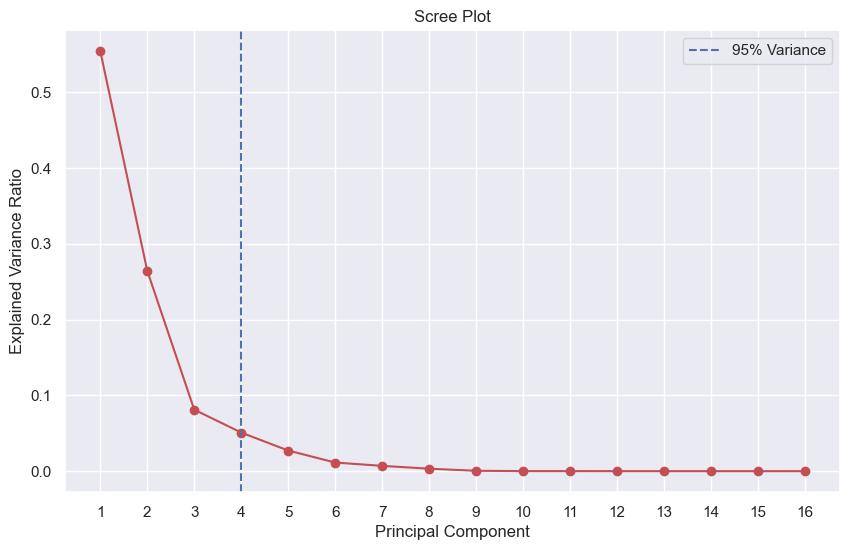

In [61]:
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(explained_variance_ratio) + 1),
    explained_variance_ratio,
    marker='o',
    color='r'
)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.axvline(
    x=np.argmax(np.cumsum(explained_variance_ratio) >= 0.95) + 1,
    color='b',
    linestyle='--',
    label='95% Variance'
)
plt.grid(True)
plt.legend()
plt.show()


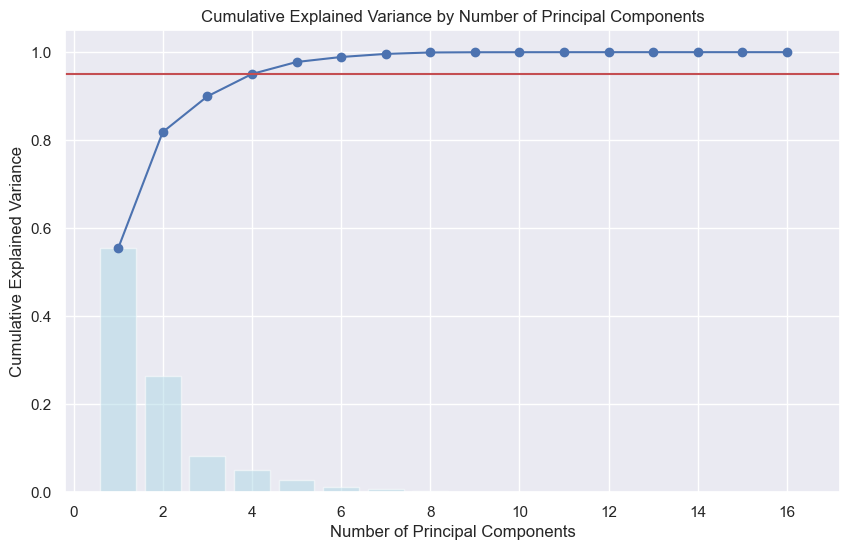

In [69]:
# Plot cumulative variance
plt.figure(figsize=(10, 6))

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='b')
plt.axhline(y=0.95, color='r', linestyle='-')  # 95% variance line
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.5, color='lightblue', label='Explained Variance Ratio')

plt.title('Cumulative Explained Variance by Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

# Classification without PCA

In [71]:
# Split the data into training and unseen datasets
data_seen = data.sample(frac=0.9, random_state=786)  # 90% for training and validation
data_unseen = data.drop(data_seen.index)  # Remaining 10% for unseen data

In [72]:
# Reset indices for clean splits
data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

# Check the shape of the splits
print('Data for Modeling: ' + str(data.shape))
print('Unseen Data for Predictions: ' + str(data_unseen.shape))

Data for Modeling: (13611, 17)
Unseen Data for Predictions: (1361, 17)


In [83]:
# PyCaret Setup: Initialize the classification environment
from pycaret.classification import *
clf = setup(data=data_seen, 
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123)  # For reproducibility

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(12250, 17)"
5,Transformed data shape,"(12250, 17)"
6,Transformed train set shape,"(8575, 17)"
7,Transformed test set shape,"(3675, 17)"
8,Numeric features,16
9,Preprocess,True


In [84]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9269,0.0000,0.9269,0.9273,0.9269,0.9116,0.9117,17.5620
lightgbm,Light Gradient Boosting Machine,0.9254,0.9938,0.9254,0.9259,0.9254,0.9098,0.9098,2.0030
rf,Random Forest Classifier,0.9226,0.9921,0.9226,0.9229,0.9225,0.9064,0.9065,1.2460
et,Extra Trees Classifier,0.9172,0.9918,0.9172,0.9178,0.9172,0.8999,0.9000,0.3800
qda,Quadratic Discriminant Analysis,0.9118,0.0000,0.9118,0.9156,0.9122,0.8936,0.8944,0.0390
lda,Linear Discriminant Analysis,0.9038,0.0000,0.9038,0.9142,0.9054,0.8837,0.8855,0.0420
dt,Decision Tree Classifier,0.8926,0.9341,0.8926,0.8933,0.8927,0.8703,0.8704,0.1210
lr,Logistic Regression,0.8634,0.0000,0.8634,0.8651,0.8634,0.8347,0.8350,0.7950
ridge,Ridge Classifier,0.8564,0.0000,0.8564,0.8681,0.8502,0.8251,0.8318,0.0370
nb,Naive Bayes,0.7637,0.9637,0.7637,0.7644,0.7604,0.7144,0.7154,0.0350


# main

In [74]:
# PyCaret Setup: Initialize the classification environment
from pycaret.classification import *
clf = setup(data=data, 
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123)  # For reproducibility

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(13611, 17)"
5,Transformed data shape,"(13611, 17)"
6,Transformed train set shape,"(9527, 17)"
7,Transformed test set shape,"(4084, 17)"
8,Numeric features,16
9,Preprocess,True


In [75]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9277,0.9937,0.9277,0.9282,0.9277,0.9125,0.9126,7.1660
gbc,Gradient Boosting Classifier,0.9260,0.0000,0.9260,0.9265,0.9259,0.9105,0.9106,22.7980
rf,Random Forest Classifier,0.9229,0.9923,0.9229,0.9232,0.9228,0.9067,0.9068,1.1420
et,Extra Trees Classifier,0.9193,0.9923,0.9193,0.9199,0.9193,0.9023,0.9024,0.6660
qda,Quadratic Discriminant Analysis,0.9151,0.0000,0.9151,0.9183,0.9154,0.8975,0.8981,0.0320
lda,Linear Discriminant Analysis,0.9071,0.0000,0.9071,0.9168,0.9086,0.8877,0.8894,0.1960
dt,Decision Tree Classifier,0.8941,0.9349,0.8941,0.8947,0.8941,0.8720,0.8721,0.1070
lr,Logistic Regression,0.8638,0.0000,0.8638,0.8649,0.8636,0.8350,0.8353,2.6870
ridge,Ridge Classifier,0.8601,0.0000,0.8601,0.8712,0.8537,0.8294,0.8360,0.0770
nb,Naive Bayes,0.7659,0.9642,0.7659,0.7664,0.7634,0.7170,0.7177,0.0380


In [76]:
best_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [77]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8604,0.0000,0.8604,0.8634,0.8608,0.8312,0.8316
1,0.8709,0.0000,0.8709,0.8722,0.8711,0.8438,0.8441
2,0.8751,0.0000,0.8751,0.8765,0.8744,0.8486,0.8490
3,0.8898,0.0000,0.8898,0.8913,0.8897,0.8667,0.8669
4,0.8720,0.0000,0.8720,0.8721,0.8720,0.8452,0.8452
5,0.8426,0.0000,0.8426,0.8436,0.8423,0.8093,0.8096
6,0.8573,0.0000,0.8573,0.8579,0.8575,0.8276,0.8276
7,0.8750,0.0000,0.8750,0.8767,0.8751,0.8484,0.8487
8,0.8540,0.0000,0.8540,0.8545,0.8532,0.8231,0.8234


In [78]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8657,0.0000,0.8657,0.8688,0.8662,0.8377,0.8382
1,0.8594,0.0000,0.8594,0.8608,0.8596,0.8300,0.8302
2,0.8961,0.0000,0.8961,0.8979,0.8962,0.8741,0.8744
3,0.8793,0.0000,0.8793,0.8810,0.8792,0.8539,0.8542
4,0.8909,0.0000,0.8909,0.8913,0.8910,0.8679,0.8680
5,0.8374,0.0000,0.8374,0.8430,0.8382,0.8030,0.8038
6,0.8835,0.0000,0.8835,0.8867,0.8844,0.8593,0.8596
7,0.8813,0.0000,0.8813,0.8834,0.8815,0.8560,0.8563
8,0.8655,0.0000,0.8655,0.8655,0.8651,0.8372,0.8374


Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [79]:
tuned_lr

LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [80]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Classification + PCA

In [87]:
clf = setup(data=data, 
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=4)  # Reduce to 4 principal components 

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Multiclass
3,Target mapping,"BARBUNYA: 0, BOMBAY: 1, CALI: 2, DERMASON: 3, HOROZ: 4, SEKER: 5, SIRA: 6"
4,Original data shape,"(13611, 17)"
5,Transformed data shape,"(13611, 5)"
6,Transformed train set shape,"(9527, 5)"
7,Transformed test set shape,"(4084, 5)"
8,Numeric features,16
9,Preprocess,True


In [88]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8909,0.0000,0.8909,0.8907,0.8904,0.8680,0.8682,4.6540
lr,Logistic Regression,0.8895,0.0000,0.8895,0.8898,0.8890,0.8663,0.8665,0.0770
qda,Quadratic Discriminant Analysis,0.8885,0.0000,0.8885,0.8892,0.8880,0.8652,0.8655,0.0520
et,Extra Trees Classifier,0.8873,0.9884,0.8873,0.8871,0.8866,0.8636,0.8638,0.3720
rf,Random Forest Classifier,0.8871,0.9878,0.8871,0.8869,0.8864,0.8633,0.8635,0.7120
lightgbm,Light Gradient Boosting Machine,0.8836,0.9885,0.8836,0.8836,0.8831,0.8591,0.8593,1.4380
lda,Linear Discriminant Analysis,0.8822,0.0000,0.8822,0.8844,0.8814,0.8575,0.8581,0.0420
knn,K Neighbors Classifier,0.8814,0.9735,0.8814,0.8815,0.8810,0.8565,0.8566,0.0710
nb,Naive Bayes,0.8661,0.9822,0.8661,0.8661,0.8645,0.8379,0.8383,0.0450
dt,Decision Tree Classifier,0.8463,0.9075,0.8463,0.8472,0.8465,0.8143,0.8144,0.0510


In [89]:
best_model_pca

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,22:00:05
Status,. . . . . . . . . . . . . . . . . .,Searching Hyperparameters
Estimator,. . . . . . . . . . . . . . . . . .,Gradient Boosting Classifier


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
evaluate_model(tuned_best_model_pca)

In [ ]:
clf = setup(data=data, 
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=3)  # Reduce to 3 principal components 

In [ ]:
#show the best model and their statistics
best_model = compare_models()

In [ ]:
clf = setup(data=data, 
            target='Class',  # Target variable is 'Class'
            train_size=0.7,  # 70% for training, 30% for validation
            session_id=123,  # For reproducibility
            normalize=True,  # Standardize numerical features
            pca=True,  # Enable PCA
            pca_components=2)  # Reduce to 2 principal components 

In [ ]:
#show the best model and their statistics
best_model = compare_models()

In [18]:
# Predict and evaluate
y_pred = clf.predict(X_test_pca_optimal)
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print(f"Accuracy: {accuracy_score(y_test, y_pred):.2f}")

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.85      0.72      0.78       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.81      0.88      0.85       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.95      0.96      0.96       386
       SEKER       0.94      0.94      0.94       406
        SIRA       0.85      0.85      0.85       527

    accuracy                           0.89      2723
   macro avg       0.90      0.90      0.90      2723
weighted avg       0.89      0.89      0.89      2723

Accuracy: 0.89
